In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET 
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from math import floor 
import matplotlib.image as mpimg
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

2025-03-01 02:01:43.823549: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-01 02:01:43.945304: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-01 02:01:43.993593: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-01 02:01:44.006204: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-01 02:01:44.102084: I tensorflow/core/platform/cpu_feature_guar

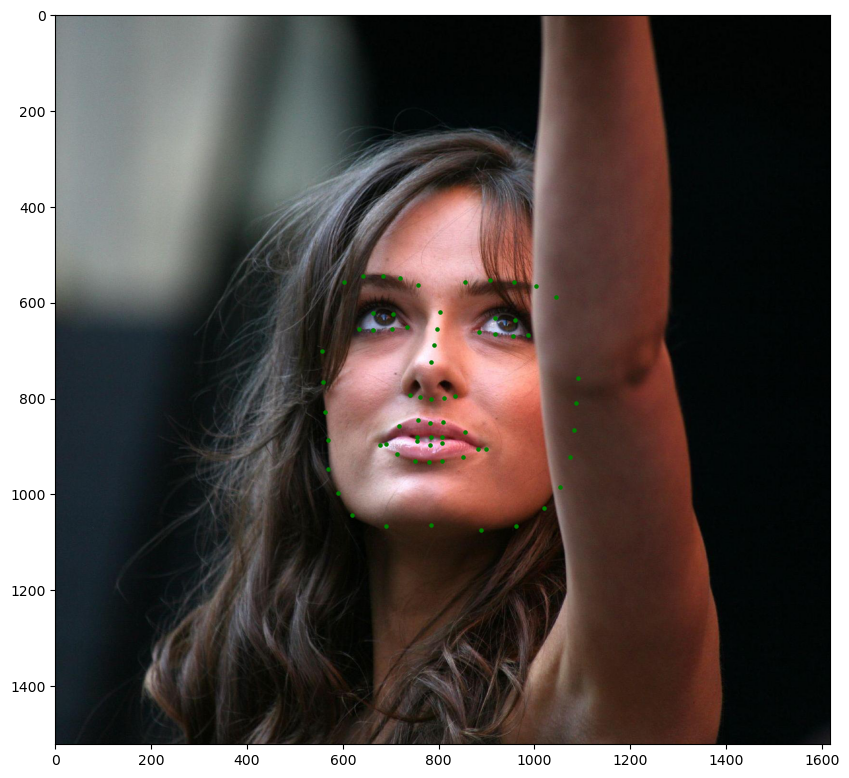

In [2]:
file = open('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.pts')
points = file.readlines()[3:-1]

landmarks = []

for point in points:
    x,y = point.split(' ')
    landmarks.append([floor(float(x)), floor(float(y[:-1]))])

landmarks = np.array(landmarks)

plt.figure(figsize=(10,10))
plt.imshow(mpimg.imread('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.jpg'))
plt.scatter(landmarks[:,0], landmarks[:,1], s = 5, c = 'g')
plt.show()

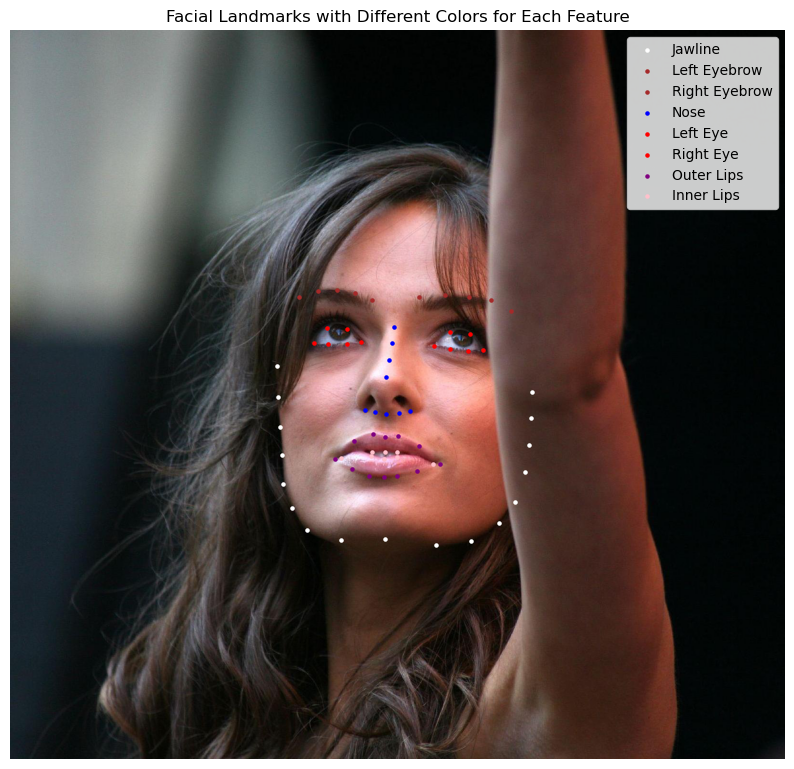

In [3]:
file = open('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.pts')
points = file.readlines()[3:-1]  

landmarks = []
for point in points:
    x, y = point.split(' ')
    landmarks.append([floor(float(x)), floor(float(y[:-1]))])

landmarks = np.array(landmarks)

plt.figure(figsize=(10,10))
image = mpimg.imread('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.jpg')
plt.imshow(image)

jawline = landmarks[0:17]         
left_eyebrow = landmarks[17:22]   
right_eyebrow = landmarks[22:27]  
nose = landmarks[27:36]          
left_eye = landmarks[36:42]      
right_eye = landmarks[42:48]     
outer_lips = landmarks[48:60]     
inner_lips = landmarks[60:68]     

plt.scatter(jawline[:, 0], jawline[:, 1], s=5, c='white', label="Jawline")
plt.scatter(left_eyebrow[:, 0], left_eyebrow[:, 1], s=5, c='brown', label="Left Eyebrow")
plt.scatter(right_eyebrow[:, 0], right_eyebrow[:, 1], s=5, c='brown', label="Right Eyebrow")
plt.scatter(nose[:, 0], nose[:, 1], s=5, c='blue', label="Nose")
plt.scatter(left_eye[:, 0], left_eye[:, 1], s=5, c='red', label="Left Eye")
plt.scatter(right_eye[:, 0], right_eye[:, 1], s=5, c='red', label="Right Eye")
plt.scatter(outer_lips[:, 0], outer_lips[:, 1], s=5, c='purple', label="Outer Lips")
plt.scatter(inner_lips[:, 0], inner_lips[:, 1], s=5, c='pink', label="Inner Lips")

plt.legend()
plt.axis("off")
plt.title("Facial Landmarks with Different Colors for Each Feature")
plt.show()

I0000 00:00:1740781771.208319  111000 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1740781771.211445  111000 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1740781771.214138  111000 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1740781771.310655  111000 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

Epoch 1/50


I0000 00:00:1740781793.453701  111421 service.cc:146] XLA service 0x7f1be4001930 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740781793.453821  111421 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2025-03-01 00:29:54.139003: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-03-01 00:29:55.954126: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-03-01 00:29:58.395633: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14234', 4 bytes spill stores, 4 bytes spill loads

2025-03-01 00:29:58.458897: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory

  1/188 ━━━━━━━━━━━━━━━━━━━━ 2:40:14 51s/step - loss: 0.5780 - mae: 0.6077

I0000 00:00:1740781824.317278  111421 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 0.0372 - mae: 0.1127

2025-03-01 00:31:09.110413: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14234', 8 bytes spill stores, 8 bytes spill loads

2025-03-01 00:31:09.236882: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14479', 12 bytes spill stores, 12 bytes spill loads

2025-03-01 00:31:31.431491: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_29', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_28', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_9', 8 bytes 

188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - loss: 0.0371 - mae: 0.1125

2025-03-01 00:32:21.223611: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1158', 8 bytes spill stores, 8 bytes spill loads




Epoch 1: val_loss improved from inf to 3.61025, saving model to face_landmarks_simple.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 184s 708ms/step - loss: 0.0370 - mae: 0.1123 - val_loss: 3.6103 - val_mae: 1.6000
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.0049 - mae: 0.0541
Epoch 2: val_loss improved from 3.61025 to 0.84977, saving model to face_landmarks_simple.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 95s 473ms/step - loss: 0.0049 - mae: 0.0541 - val_loss: 0.8498 - val_mae: 0.7735
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.0033 - mae: 0.0437
Epoch 3: val_loss improved from 0.84977 to 0.27327, saving model to face_landmarks_simple.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 89s 435ms/step - loss: 0.0033 - mae: 0.0437 - val_loss: 0.2733 - val_mae: 0.4366
Epoch 4/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0025 - mae: 0.0377
Epoch 4: val_loss improved from 0.27327 to 0.05379, saving model to face_landmarks_simple.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 87s 429ms/

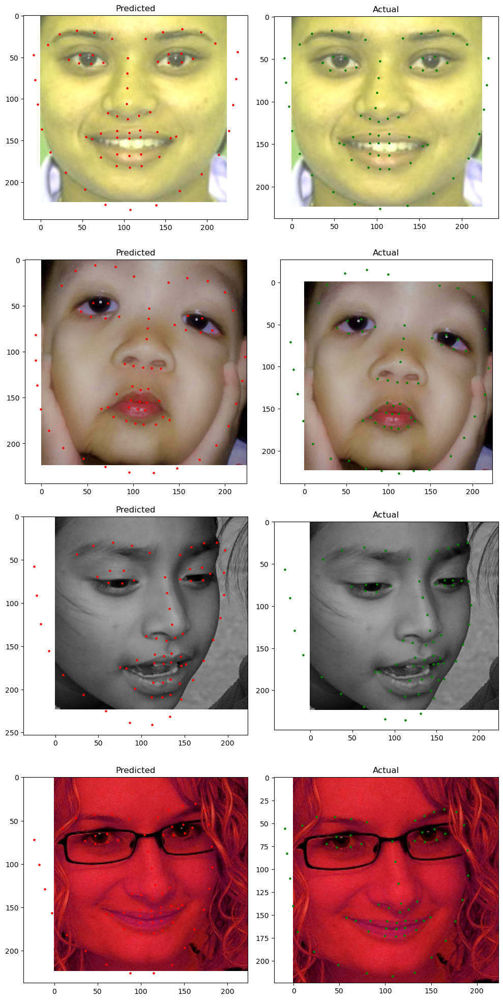

In [5]:
tree = ET.parse('ibug_300W_large_face_landmark_dataset/labels_ibug_300W_train.xml')
root = tree.getroot()

image_paths = []
crop_params = []
all_landmarks = []

for filename in root[2]:
    img_path = os.path.join('ibug_300W_large_face_landmark_dataset', filename.attrib['file'])
    image_paths.append(img_path)
    
    box = filename[0].attrib
    crop_params.append([
        int(box['left']),
        int(box['top']),
        int(box['width']),
        int(box['height'])
    ])
    
    landmarks = []
    for num in range(68):
        x = int(filename[0][num].attrib['x'])
        y = int(filename[0][num].attrib['y'])
        landmarks.extend([x, y])
    all_landmarks.append(landmarks)

dataset = tf.data.Dataset.from_tensor_slices((
    tf.constant(image_paths),
    tf.constant(crop_params, dtype=tf.int32),
    tf.constant(all_landmarks, dtype=tf.float32)
))


def process_data(image_path, crop, landmarks):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32) 
    
    img_shape = tf.shape(img)
    img_height = img_shape[0]
    img_width = img_shape[1]
    
    left = tf.cast(crop[0], tf.int32)
    top = tf.cast(crop[1], tf.int32)
    width = tf.cast(crop[2], tf.int32)
    height = tf.cast(crop[3], tf.int32)
    
    left = tf.maximum(0, left)
    top = tf.maximum(0, top)
    width = tf.minimum(width, img_width - left)
    height = tf.minimum(height, img_height - top)
    width = tf.maximum(1, width) 
    height = tf.maximum(1, height)
    
    img = tf.image.crop_to_bounding_box(
        img, 
        offset_height=top,
        offset_width=left,
        target_height=height,
        target_width=width
    )
    
    img = tf.image.resize(img, [224, 224])
    img = tf.image.random_brightness(img, 0.3)
    img = tf.image.random_contrast(img, 0.7, 1.3)
    img = tf.image.random_hue(img, 0.1)
    img = tf.clip_by_value(img, 0.0, 1.0)
    
    img = (img * 2) - 1
    
    landmarks = tf.reshape(landmarks, (68, 2))
    
    landmarks -= tf.cast([left, top], tf.float32)
    
    scale = tf.cast([width, height], tf.float32)
    scale = tf.maximum(scale, 1.0)
    landmarks /= scale
    
    landmarks *= 224.0
    landmarks = (landmarks / 224.0) - 0.5
    
    return img, landmarks

dataset = dataset.map(process_data, num_parallel_calls=tf.data.AUTOTUNE)
total = len(image_paths)
train_ds = dataset.take(int(0.9*total)).shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
val_ds = dataset.skip(int(0.9*total)).batch(8).prefetch(tf.data.AUTOTUNE)

base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = True

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(136),  # 68 landmarks * 2 coordinates
    tf.keras.layers.Reshape((68, 2))  # to match labels
])

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

checkpoint = ModelCheckpoint(
    'face_landmarks_simple.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint, early_stop]
)

sample_images, sample_labels = next(iter(val_ds))
predictions = model.predict(sample_images)

images_plot = (sample_images.numpy() + 1) / 2 
pred_landmarks = (predictions.reshape(-1, 68, 2) + 0.5) * 224
true_landmarks = (sample_labels.numpy() + 0.5) * 224

plt.figure(figsize=(10, 20))
for i in range(4):
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(images_plot[i])
    plt.scatter(pred_landmarks[i,:,0], pred_landmarks[i,:,1], c='r', s=5)
    plt.title('Predicted')
    
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(images_plot[i])
    plt.scatter(true_landmarks[i,:,0], true_landmarks[i,:,1], c='g', s=5)
    plt.title('Actual')
plt.tight_layout()
plt.show()

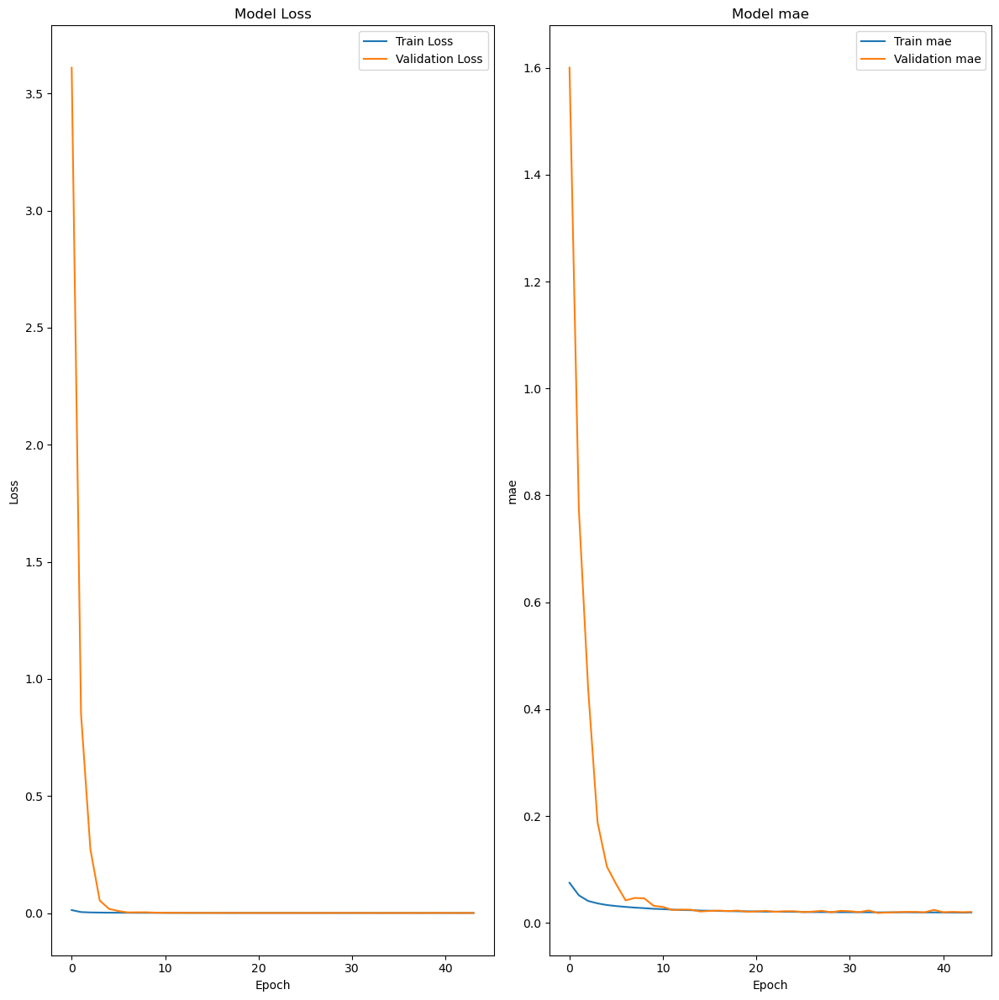

In [13]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train mae')
plt.plot(history.history['val_mae'], label='Validation mae')
plt.title('Model mae')
plt.xlabel('Epoch')
plt.ylabel('mae')
plt.legend()

plt.tight_layout()
plt.show()

In [14]:
loaded_model = tf.keras.models.load_model('face_landmarks_simple.keras')

history = loaded_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=1 
)

loaded_model.save('face_landmarks_simple_finetuned.keras')

188/188 ━━━━━━━━━━━━━━━━━━━━ 149s 621ms/step - loss: 7.2647e-04 - mae: 0.0202 - val_loss: 9.6120e-04 - val_mae: 0.0230


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


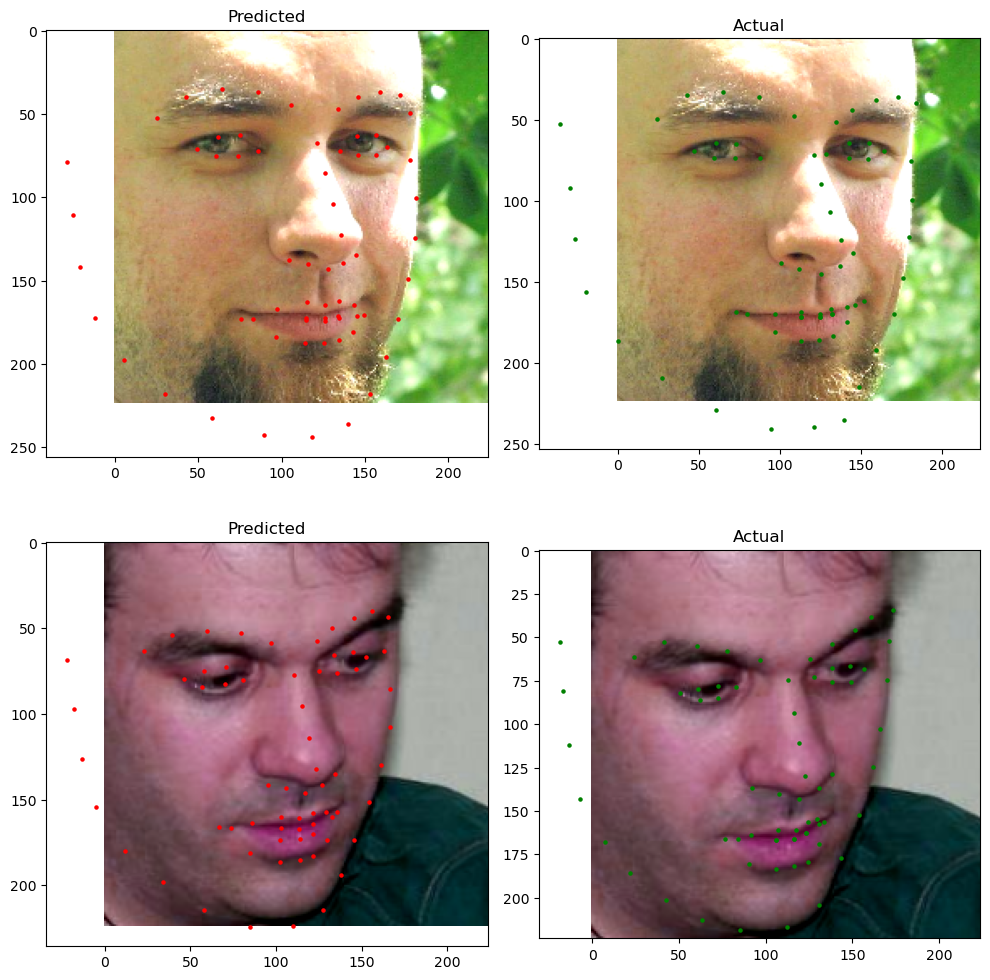

In [15]:
val_iterator = iter(val_ds)
sample_images, sample_labels = next(val_iterator)
sample_images, sample_labels = next(val_iterator)
predictions = model.predict(sample_images)

images_plot = (sample_images.numpy() + 1) / 2 
pred_landmarks = (predictions.reshape(-1, 68, 2) + 0.5) * 224
true_landmarks = (sample_labels.numpy() + 0.5) * 224

plt.figure(figsize=(10, 20))
for i in range(2):
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(images_plot[i])
    plt.scatter(pred_landmarks[i,:,0], pred_landmarks[i,:,1], c='r', s=5)
    plt.title('Predicted')
    
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(images_plot[i])
    plt.scatter(true_landmarks[i,:,0], true_landmarks[i,:,1], c='g', s=5)
    plt.title('Actual')
plt.tight_layout()
plt.show()

In [2]:
import math 
import tensorflow_addons as tfa  

tree = ET.parse('ibug_300W_large_face_landmark_dataset/labels_ibug_300W_train.xml')
root = tree.getroot()

image_paths = []
crop_params = []
all_landmarks = []

for filename in root[2]:
    img_path = os.path.join('ibug_300W_large_face_landmark_dataset', filename.attrib['file'])
    image_paths.append(img_path)
    
    box = filename[0].attrib
    crop_params.append([
        int(box['left']),
        int(box['top']),
        int(box['width']),
        int(box['height'])
    ])
    
    landmarks = []
    for num in range(68):
        x = int(filename[0][num].attrib['x'])
        y = int(filename[0][num].attrib['y'])
        landmarks.extend([x, y])
    all_landmarks.append(landmarks)

dataset = tf.data.Dataset.from_tensor_slices((
    tf.constant(image_paths),
    tf.constant(crop_params, dtype=tf.int32),
    tf.constant(all_landmarks, dtype=tf.float32)
))

def rotate_image_and_landmarks(image, landmarks, angle):
    angle_rad = angle * (math.pi / 180.0)  
    rotated_image = tfa.image.rotate(
        image,
        angles=angle_rad,
        interpolation='BILINEAR'
    )
    
    image_center = tf.constant([112.0, 112.0], dtype=tf.float32)
    
    landmarks_reshaped = tf.reshape(landmarks, [-1, 2])
    landmarks_centered = landmarks_reshaped - image_center
    
    # rotation matrix
    cos_val = tf.cos(angle_rad)
    sin_val = tf.sin(angle_rad)
    rotation_matrix = tf.stack([
        [cos_val, -sin_val],
        [sin_val, cos_val]
    ])
    
    # apply rotation
    rotated_landmarks = tf.matmul(landmarks_centered, rotation_matrix)
    
    # restore original coordinate system
    rotated_landmarks += image_center
    return rotated_image, rotated_landmarks

def process_data(image_path, crop, landmarks):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)   
    
    img_shape = tf.shape(img)
    img_height = img_shape[0]
    img_width = img_shape[1]
    
    left = tf.cast(crop[0], tf.int32)
    top = tf.cast(crop[1], tf.int32)
    width = tf.cast(crop[2], tf.int32)
    height = tf.cast(crop[3], tf.int32)
    
    left = tf.maximum(0, left)
    top = tf.maximum(0, top)
    width = tf.minimum(width, img_width - left)
    height = tf.minimum(height, img_height - top)
    width = tf.maximum(1, width)  
    height = tf.maximum(1, height) 
    
    # Crop image
    img = tf.image.crop_to_bounding_box(
        img, 
        offset_height=top,
        offset_width=left,
        target_height=height,
        target_width=width
    )
    
    img = tf.image.resize(img, [224, 224])
    
    landmarks = tf.reshape(landmarks, (68, 2))
    
    landmarks -= tf.cast([left, top], tf.float32) 
    scale = tf.cast([width, height], tf.float32)
    scale = tf.maximum(scale, 1.0)
    landmarks /= scale 
    landmarks *= 224.0
    
    angle = tf.random.uniform([], minval=-10, maxval=10) 
    img, landmarks = rotate_image_and_landmarks(img, landmarks, angle)
    
    img = tf.image.random_brightness(img, 0.3)  
    img = tf.image.random_contrast(img, 0.7, 1.3)
    img = tf.image.random_hue(img, 0.1) 
    img = tf.clip_by_value(img, 0.0, 1.0) 
    landmarks = (landmarks / 224.0) - 0.5
    
    return img, landmarks

dataset = dataset.map(process_data, num_parallel_calls=tf.data.AUTOTUNE)
total = len(image_paths)
train_ds = dataset.take(int(0.9*total)).shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
val_ds = dataset.skip(int(0.9*total)).batch(8).prefetch(tf.data.AUTOTUNE)

/home/ghaidaa/anaconda3/envs/tf_env_v2/lib/python3.9/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/home/ghaidaa/anaconda3/envs/tf_env_v2/lib/python3.9/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.17.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, d

2025-03-01 02:02:50.922670: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


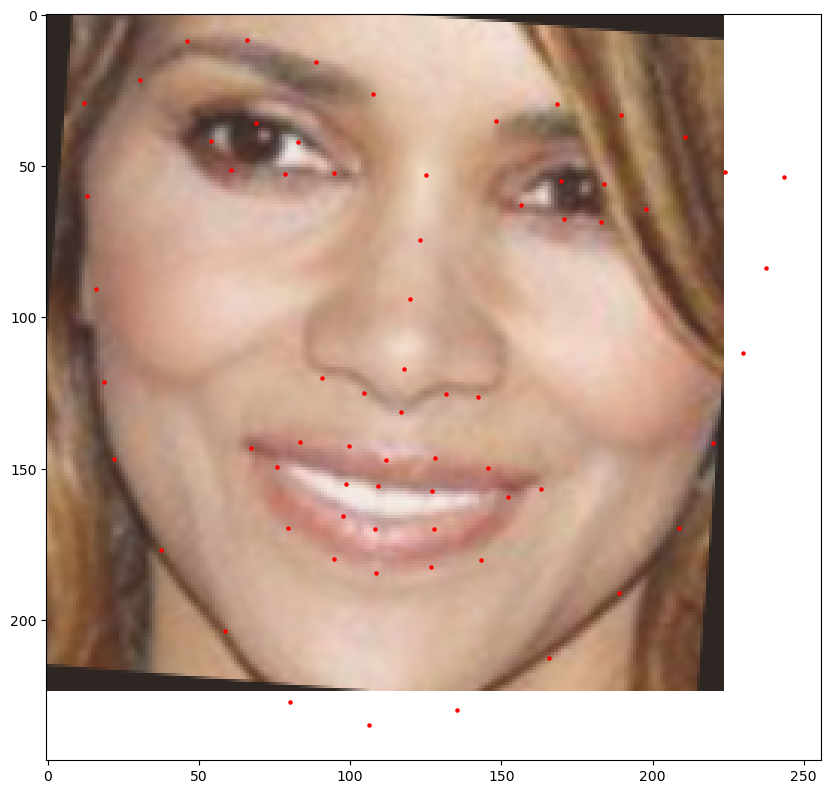

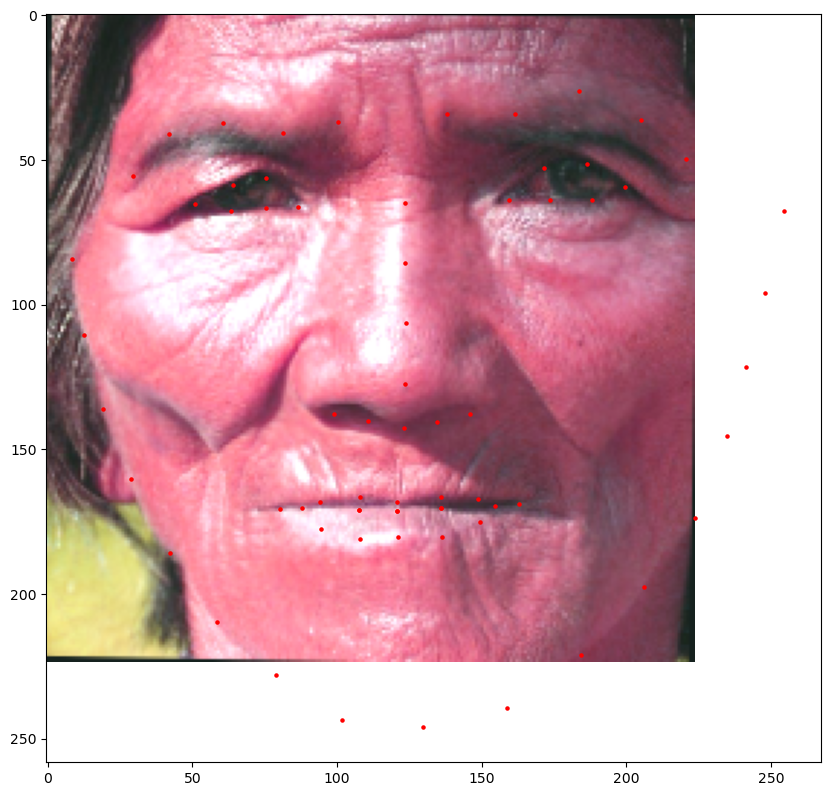

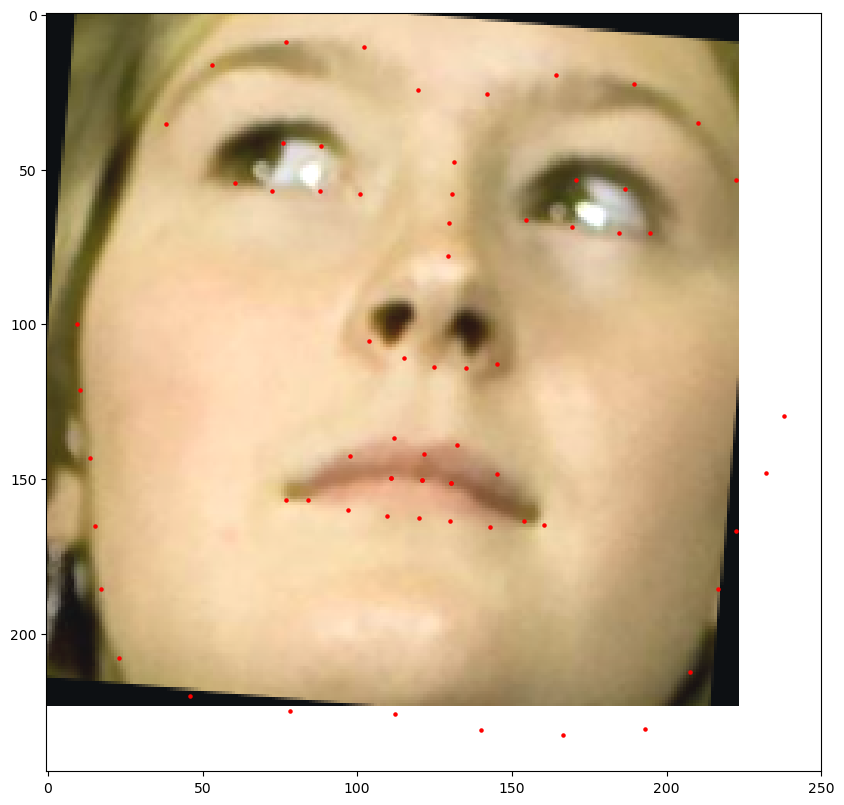

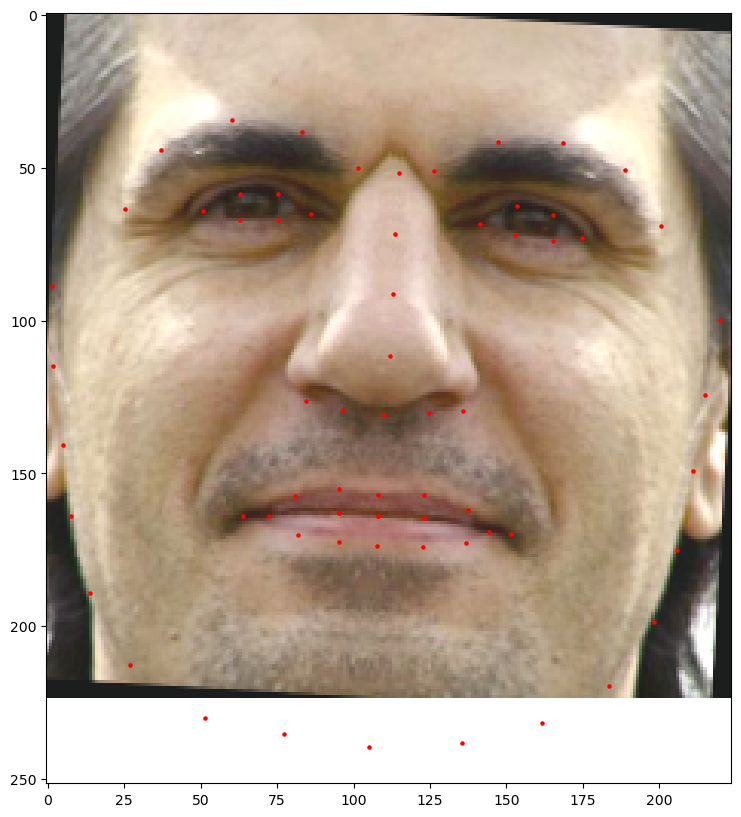

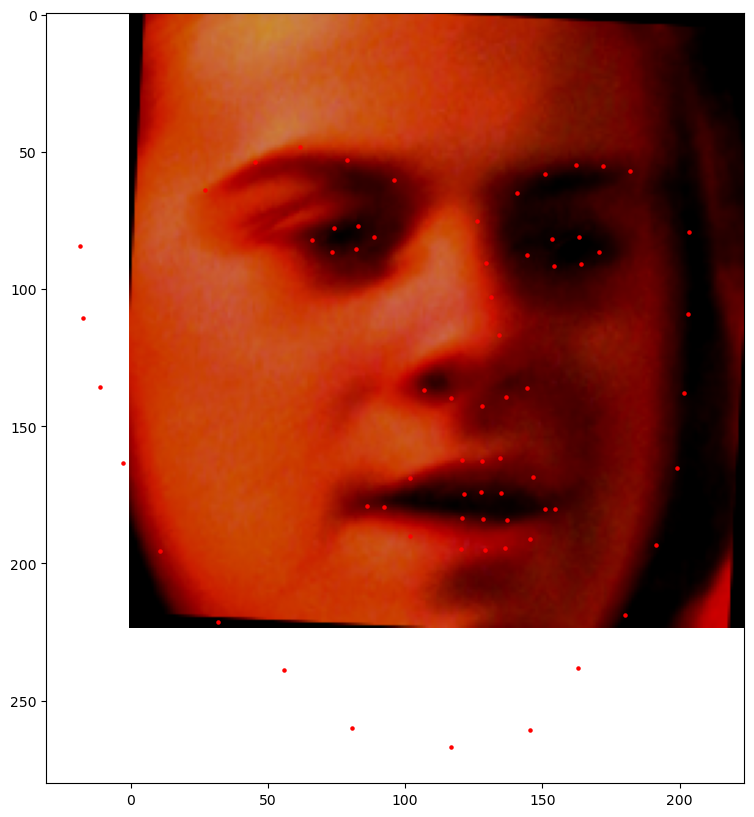

...

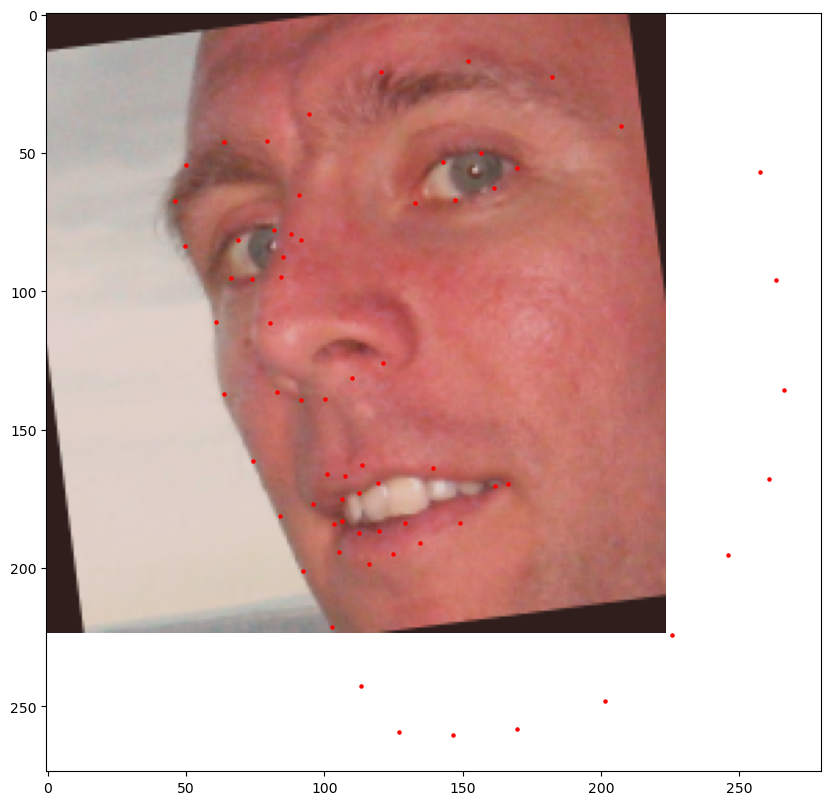

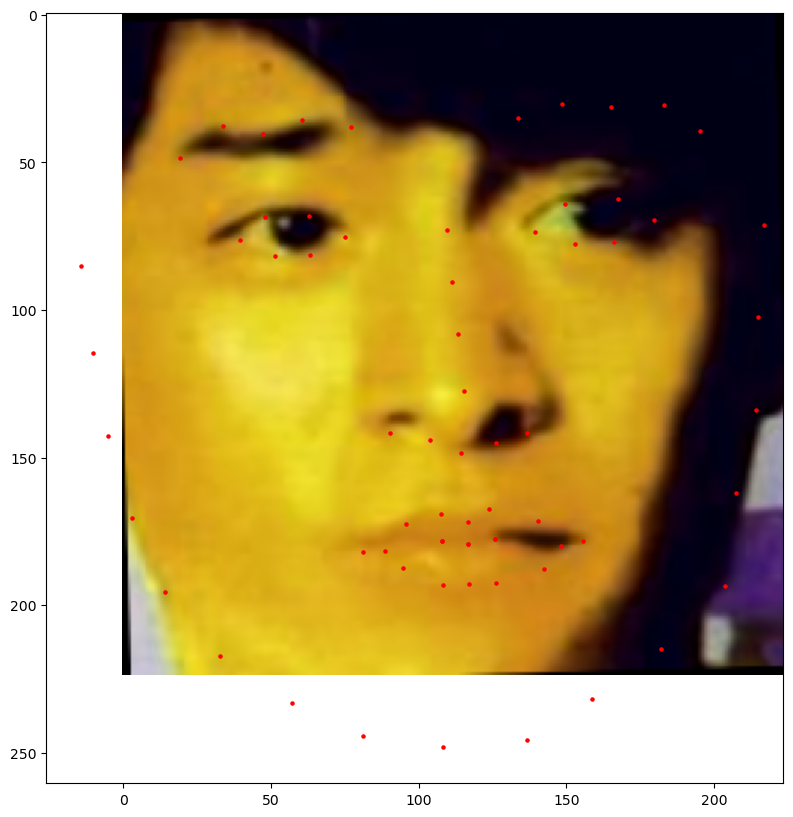

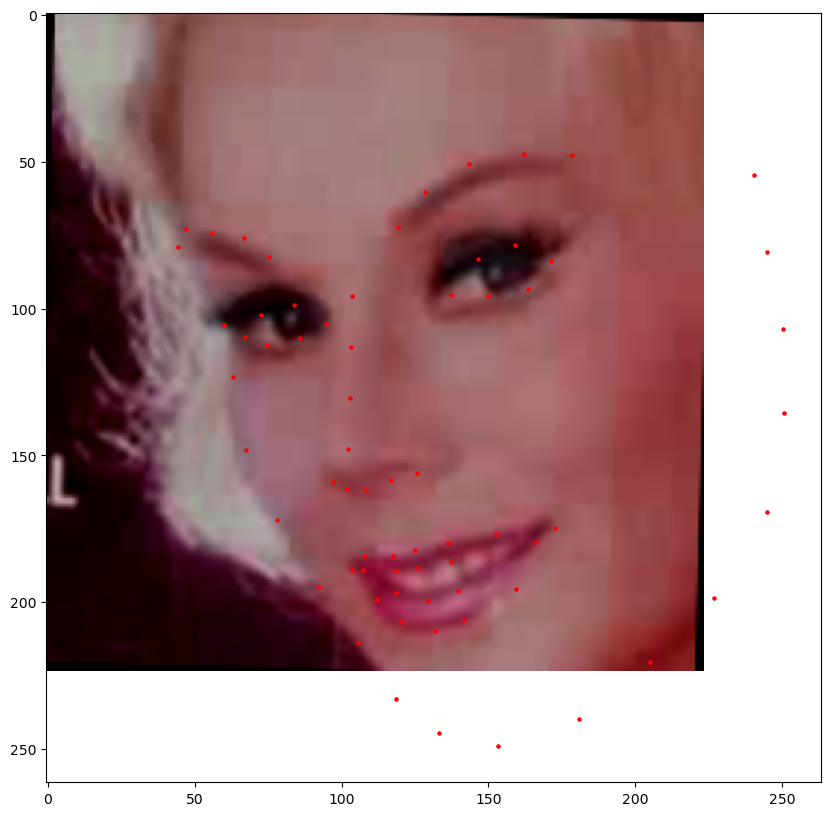

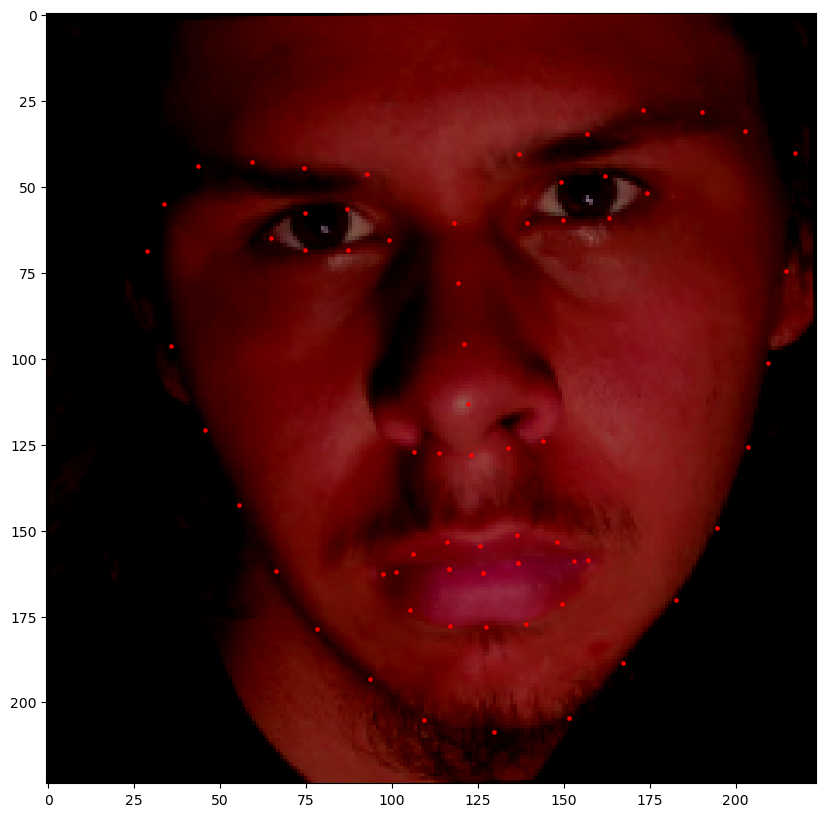

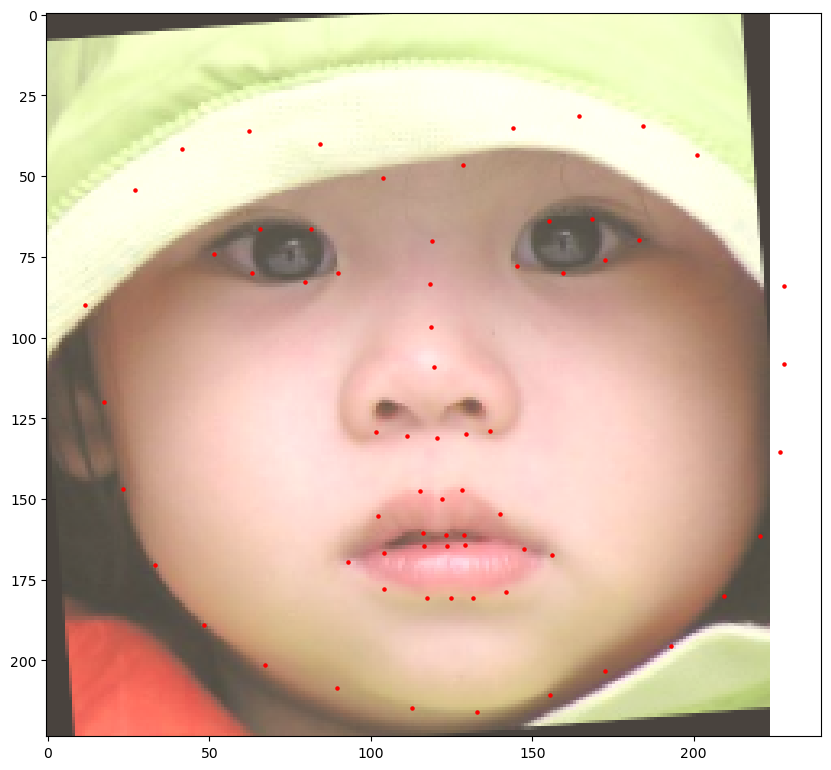

In [3]:
for img, landmarks in train_ds.take(12):
    img = img[0] 
    landmarks = landmarks[0]  
    landmarks_pixels = (landmarks + 0.5) * 224.0
    
    plt.figure(figsize=(10, 10))
    plt.imshow(img.numpy())
    plt.scatter(landmarks_pixels[:, 0], landmarks_pixels[:, 1], c='r', s=5)
    # plt.savefig('landmark_vis.png')

In [4]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = True

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(136),
    tf.keras.layers.Reshape((68, 2))
])

checkpoint = ModelCheckpoint(
    'face_landmarks_mod.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='mse',
    metrics=['mae']
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint, early_stop]
)

Epoch 1/50


I0000 00:00:1740787419.340727   15101 service.cc:146] XLA service 0x7f2d70004200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740787419.341104   15101 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2025-03-01 02:03:40.081588: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-03-01 02:03:41.954930: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-03-01 02:03:44.619211: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14234', 4 bytes spill stores, 4 bytes spill loads

2025-03-01 02:03:44.705196: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory

  1/188 ━━━━━━━━━━━━━━━━━━━━ 2:45:01 53s/step - loss: 0.5790 - mae: 0.6036

I0000 00:00:1740787451.088108   15101 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.1004 - mae: 0.2144

2025-03-01 02:04:55.142187: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14234', 8 bytes spill stores, 8 bytes spill loads

2025-03-01 02:04:56.241249: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14479', 12 bytes spill stores, 12 bytes spill loads

2025-03-01 02:05:19.609488: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_29', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_28', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_9', 8 bytes 

188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step - loss: 0.1001 - mae: 0.2140

2025-03-01 02:06:03.196332: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1158', 8 bytes spill stores, 8 bytes spill loads




Epoch 1: val_loss improved from inf to 0.45438, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 180s 682ms/step - loss: 0.0998 - mae: 0.2136 - val_loss: 0.4544 - val_mae: 0.5472
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - loss: 0.0110 - mae: 0.0827
Epoch 2: val_loss improved from 0.45438 to 0.35297, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 90s 446ms/step - loss: 0.0110 - mae: 0.0826 - val_loss: 0.3530 - val_mae: 0.4944
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - loss: 0.0079 - mae: 0.0695
Epoch 3: val_loss improved from 0.35297 to 0.16334, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 90s 446ms/step - loss: 0.0079 - mae: 0.0695 - val_loss: 0.1633 - val_mae: 0.3372
Epoch 4/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0069 - mae: 0.0649
Epoch 4: val_loss improved from 0.16334 to 0.08026, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 93s 458ms/step - loss:

2025-03-01 02:43:20.390115: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 794 of 1000
2025-03-01 02:43:23.966429: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - loss: 0.0014 - mae: 0.0283
Epoch 25: val_loss improved from 0.00100 to 0.00099, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 116s 542ms/step - loss: 0.0014 - mae: 0.0283 - val_loss: 9.9100e-04 - val_mae: 0.0231
Epoch 26/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.0013 - mae: 0.0278
Epoch 26: val_loss improved from 0.00099 to 0.00095, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 94s 468ms/step - loss: 0.0013 - mae: 0.0278 - val_loss: 9.4991e-04 - val_mae: 0.0229
Epoch 27/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - loss: 0.0013 - mae: 0.0272
Epoch 27: val_loss improved from 0.00095 to 0.00094, saving model to face_landmarks_mod.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 86s 425ms/step - loss: 0.0013 - mae: 0.0272 - val_loss: 9.4344e-04 - val_mae: 0.0226
Epoch 28/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0013 - mae: 0.0270
Epoch 28: val_loss did not improve from 0.00094
188

2025-03-01 03:13:17.736773: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 852 of 1000
2025-03-01 03:13:21.742571: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - loss: 9.5144e-04 - mae: 0.0232
Epoch 41: val_loss did not improve from 0.00065
188/188 ━━━━━━━━━━━━━━━━━━━━ 148s 712ms/step - loss: 9.5135e-04 - mae: 0.0232 - val_loss: 7.7743e-04 - val_mae: 0.0205
Epoch 42/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - loss: 8.9848e-04 - mae: 0.0226
Epoch 42: val_loss did not improve from 0.00065
188/188 ━━━━━━━━━━━━━━━━━━━━ 102s 500ms/step - loss: 8.9847e-04 - mae: 0.0226 - val_loss: 7.9262e-04 - val_mae: 0.0209
Epoch 43/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 9.1612e-04 - mae: 0.0228
Epoch 43: val_loss did not improve from 0.00065
188/188 ━━━━━━━━━━━━━━━━━━━━ 95s 464ms/step - loss: 9.1594e-04 - mae: 0.0228 - val_loss: 7.6452e-04 - val_mae: 0.0205
Epoch 44/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 8.7585e-04 - mae: 0.0222
Epoch 44: val_loss did not improve from 0.00065
188/188 ━━━━━━━━━━━━━━━━━━━━ 96s 476ms/step - loss: 8.7582e-04 - mae: 0.0222 - val_loss: 7.4826e-04 - val_mae: 0

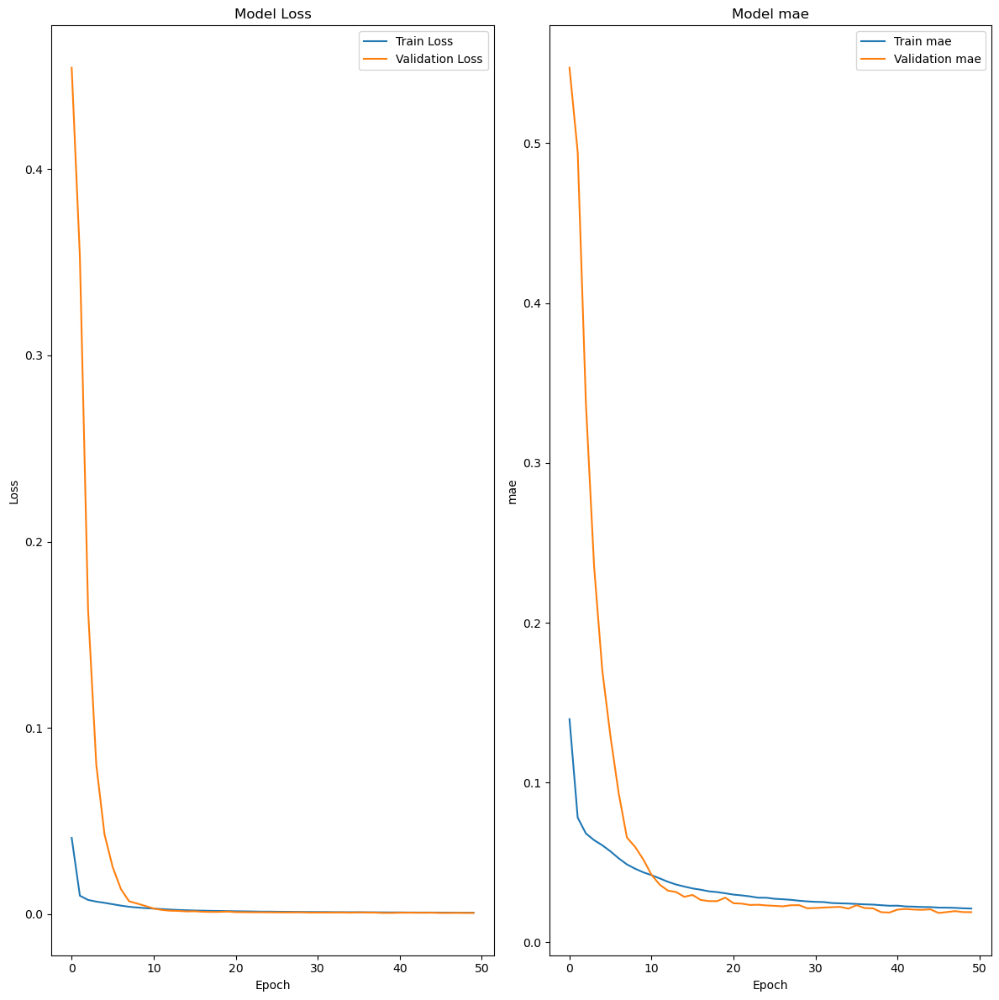

In [5]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train mae')
plt.plot(history.history['val_mae'], label='Validation mae')
plt.title('Model mae')
plt.xlabel('Epoch')
plt.ylabel('mae')
plt.legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


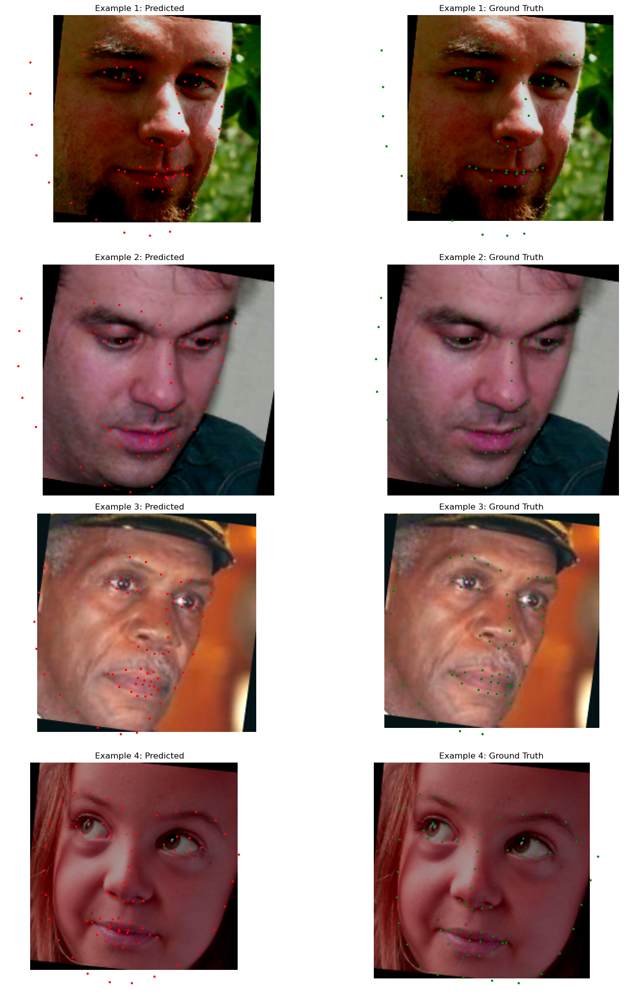

In [6]:
val_iterator = iter(val_ds)
sample_images, sample_labels = next(val_iterator)
sample_images, sample_labels = next(val_iterator)

predictions = model.predict(sample_images)

plt.figure(figsize=(16, 20))
num_samples = 4

for i in range(num_samples):
    img = sample_images[i]
    true_landmarks = sample_labels[i]
    pred_landmarks = predictions[i]
    true_landmarks_pixels = (true_landmarks + 0.5) * 224.0
    pred_landmarks_pixels = (pred_landmarks + 0.5) * 224.0
    
    # landmarks are in shape (68, 2) for 68 facial landmarks with x,y coordinates
    true_landmarks_pixels = tf.reshape(true_landmarks_pixels, (-1, 2))
    pred_landmarks_pixels = tf.reshape(pred_landmarks_pixels, (-1, 2))
    
    plt.subplot(num_samples, 2, 2*i+1)
    plt.imshow(img.numpy())
    plt.scatter(pred_landmarks_pixels[:, 0], pred_landmarks_pixels[:, 1], c='r', s=5)
    plt.title(f'Example {i+1}: Predicted')
    plt.axis('off')
    
    plt.subplot(num_samples, 2, 2*i+2)
    plt.imshow(img.numpy())
    plt.scatter(true_landmarks_pixels[:, 0], true_landmarks_pixels[:, 1], c='g', s=5)
    plt.title(f'Example {i+1}: Ground Truth')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [7]:
loaded_model = tf.keras.models.load_model('face_landmarks_mod.keras')

history = loaded_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=1
)

loaded_model.save('face_landmarks_mod_finetuned.keras')

188/188 ━━━━━━━━━━━━━━━━━━━━ 140s 579ms/step - loss: 8.4648e-04 - mae: 0.0219 - val_loss: 6.7490e-04 - val_mae: 0.0188


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


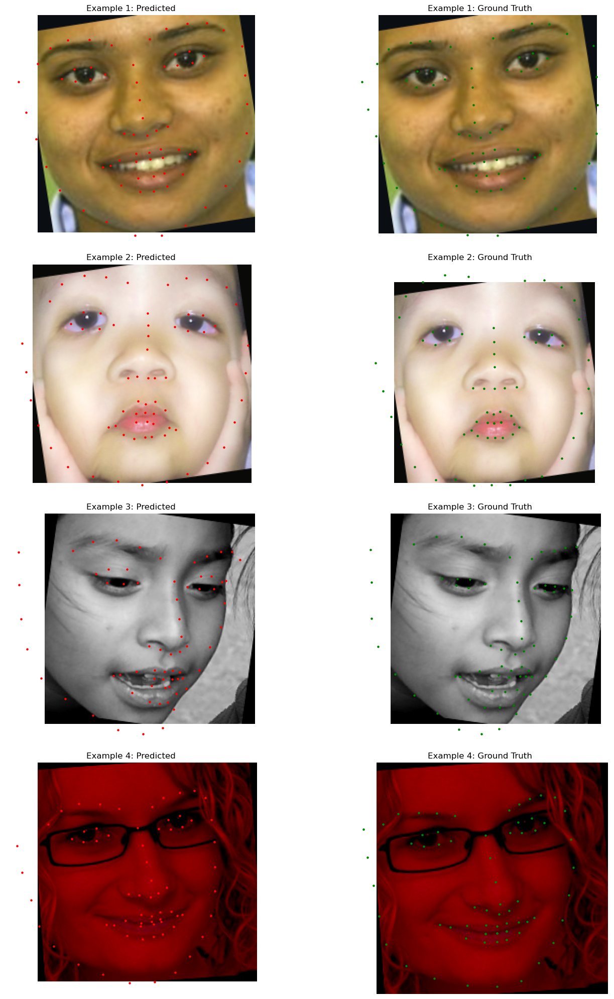

In [8]:
sample_images, sample_labels = next(iter(val_ds))
predictions = model.predict(sample_images)

plt.figure(figsize=(16, 20))

num_samples = 4

for i in range(num_samples):
    img = sample_images[i]
    
    true_landmarks = sample_labels[i]
    pred_landmarks = predictions[i]
    true_landmarks_pixels = (true_landmarks + 0.5) * 224.0
    pred_landmarks_pixels = (pred_landmarks + 0.5) * 224.0
    
    # landmarks are in shape (68, 2) for 68 facial landmarks with x,y coordinates
    true_landmarks_pixels = tf.reshape(true_landmarks_pixels, (-1, 2))
    pred_landmarks_pixels = tf.reshape(pred_landmarks_pixels, (-1, 2))
    
    plt.subplot(num_samples, 2, 2*i+1)
    plt.imshow(img.numpy())
    plt.scatter(pred_landmarks_pixels[:, 0], pred_landmarks_pixels[:, 1], c='r', s=5)
    plt.title(f'Example {i+1}: Predicted')
    plt.axis('off')
    
    plt.subplot(num_samples, 2, 2*i+2)
    plt.imshow(img.numpy())
    plt.scatter(true_landmarks_pixels[:, 0], true_landmarks_pixels[:, 1], c='g', s=5)
    plt.title(f'Example {i+1}: Ground Truth')
    plt.axis('off')

plt.tight_layout()
plt.show()